Copyright (c) MONAI Consortium  
Licensed under the Apache License, Version 2.0 (the "License");  
you may not use this file except in compliance with the License.  
You may obtain a copy of the License at  
&nbsp;&nbsp;&nbsp;&nbsp;http://www.apache.org/licenses/LICENSE-2.0  
Unless required by applicable law or agreed to in writing, software  
distributed under the License is distributed on an "AS IS" BASIS,  
WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.  
See the License for the specific language governing permissions and  
limitations under the License.

# 3D Multi-organ Segmentation with Swin UNETR  (BTCV Challenge)


This tutorial uses a Swin UNETR [1] model for the task of multi-organ segmentation task using the BTCV challenge dataset. The architecture of Swin UNETR is demonstrated as below

![image](../figures/swin_unetr_btcv.png)

The following features are included in this tutorial:
1. Transforms for dictionary format data.
1. Define a new transform according to MONAI transform API.
1. Load Nifti image with metadata, load a list of images and stack them.
1. Randomly adjust intensity for data augmentation.
1. Cache IO and transforms, ThreadDataLoader, and AMP to accelerate training and validation.
1. Swin UNETR model, DiceCE loss function, Mean Dice metric for multi-organ segmentation task.

For this tutorial, the dataset needs to be downloaded from: https://www.synapse.org/#!Synapse:syn3193805/wiki/217752. More details are provided in the "Download dataset" section below.

In addition, the json file for data splits needs to be downloaded from this [link](https://drive.google.com/file/d/1qcGh41p-rI3H_sQ0JwOAhNiQSXriQqGi/view?usp=sharing). Once downloaded, place the json file in the same folder as the dataset. 

For BTCV dataset, under Institutional Review Board (IRB) supervision, 50 abdomen CT scans of were randomly selected from a combination of an ongoing colorectal cancer chemotherapy trial, and a retrospective ventral hernia study. The 50 scans were captured during portal venous contrast phase with variable volume sizes (512 x 512 x 85 - 512 x 512 x 198) and field of views (approx. 280 x 280 x 280 mm3 - 500 x 500 x 650 mm3). The in-plane resolution varies from 0.54 x 0.54 mm2 to 0.98 x 0.98 mm2, while the slice thickness ranges from 2.5 mm to 5.0 mm. 

- Target: 13 abdominal organs including 
    1. Spleen 
    2. Right Kidney 
    3. Left Kidney 
    4. Gallbladder 
    5. Esophagus 
    6. Liver 
    7. Stomach 
    8. Aorta 
    9. IVC 
    10. Portal and Splenic Veins 
    11. Pancreas 
    12. Right adrenal gland 
    13. Left adrenal gland.
- Modality: CT
- Size: 30 3D volumes (24 Training + 6 Testing)
- Challenge: BTCV MICCAI Challenge

The following figure shows image patches with the organ sub-regions that are annotated in the CT (top left) and the final labels for the whole dataset (right).

Data, figures and resources are taken from: 


1. [Self-Supervised Pre-Training of Swin Transformers
for 3D Medical Image Analysis](https://arxiv.org/abs/2111.14791)

2. [Swin UNETR: Swin Transformers for Semantic Segmentation of Brain Tumors in MRI Images](https://arxiv.org/abs/2201.01266)

3. [High-resolution 3D abdominal segmentation with random patch network fusion (MIA)](https://www.sciencedirect.com/science/article/abs/pii/S1361841520302589)

4. [Efficient multi-atlas abdominal segmentation on clinically acquired CT with SIMPLE context learning (MIA)](https://www.sciencedirect.com/science/article/abs/pii/S1361841515000766?via%3Dihub)


![image](../figures/BTCV_organs.png)



The image patches show anatomies of a subject, including: 
1. large organs: spleen, liver, stomach. 
2. Smaller organs: gallbladder, esophagus, kidneys, pancreas. 
3. Vascular tissues: aorta, IVC, P&S Veins. 
4. Glands: left and right adrenal gland

If you find this tutorial helpful, please consider citing [1] and [2]:

[1]: Tang, Y., Yang, D., Li, W., Roth, H.R., Landman, B., Xu, D., Nath, V. and Hatamizadeh, A., 2022. Self-supervised pre-training of swin transformers for 3d medical image analysis. In Proceedings of the IEEE/CVF Conference on Computer Vision and Pattern Recognition (pp. 20730-20740).

[2]: Hatamizadeh, A., Nath, V., Tang, Y., Yang, D., Roth, H. and Xu, D., 2022. Swin UNETR: Swin Transformers for Semantic Segmentation of Brain Tumors in MRI Images. arXiv preprint arXiv:2201.01266.

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/Project-MONAI/tutorials/blob/main/3d_segmentation/swin_unetr_btcv_segmentation_3d.ipynb)


# Pre-trained Swin UNETR Encoder

We use weights from self-supervised pre-training of Swin UNETR encoder (3D Swin Tranformer) on a cohort of 5050 CT scans from publicly available datasets. The encoder is pre-trained using reconstructin, rotation prediction and contrastive learning pre-text tasks as shown below. For more details, please refer to [1] (CVPR paper) and see this [repository](https://github.com/Project-MONAI/research-contributions/tree/main/SwinUNETR/Pretrain). 

![image](https://lh3.googleusercontent.com/pw/AM-JKLVLgduGZ9naCSasWg09U665NBdd3UD4eLTy15wJiwbmKLS_p5WSZ2MBcRePEJO2tv9X3TkC52MsbnomuPy5JT3vSVeCji1MOEuAzcsxily88TdbHuAt6PzccefwKupbXyOCumK5hzz5Ul38kZnlEQ84=w397-h410-no?authuser=2)

Please download the pre-trained weights from this [link](https://github.com/Project-MONAI/MONAI-extra-test-data/releases/download/0.8.1/model_swinvit.pt) and place it in the root directory of this tutorial. 

If training from scratch is desired, please skip the step for initializing from pre-trained weights. 

## Setup environment

In [1]:
!python -c "import monai; import nibabel; import tqdm" || pip install -q "monai-weekly[nibabel, tqdm]"
!python -c "import matplotlib" || pip install -q matplotlib
%matplotlib inline

Traceback (most recent call last):
  File "<string>", line 1, in <module>
ModuleNotFoundError: No module named 'monai'


## Setup imports

In [2]:
!pip install "monai[einops]"

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 19.1 MB/s eta 0:00:0000:0100:01


In [4]:
import os
import shutil
import tempfile

import matplotlib.pyplot as plt
from tqdm import tqdm

from monai.losses import DiceCELoss
from monai.inferers import sliding_window_inference
from monai.transforms import (
    AsDiscrete,
    Compose,
    CropForegroundd,
    LoadImaged,
    Orientationd,
    EnsureChannelFirstd,
    RandFlipd,
    RandCropByPosNegLabeld,
    RandShiftIntensityd,
    ScaleIntensityRanged,
    Spacingd,
    RandRotate90d,
    EnsureTyped,
    MapTransform
)

from monai.config import print_config
from monai.metrics import DiceMetric
from monai.networks.nets import SwinUNETR

from monai.data import (
    ThreadDataLoader,
    CacheDataset,
    load_decathlon_datalist,
    decollate_batch,
    set_track_meta,
)


import torch

print_config()

MONAI version: 1.3.2
Numpy version: 1.26.4
Pytorch version: 2.1.2
MONAI flags: HAS_EXT = False, USE_COMPILED = False, USE_META_DICT = False
MONAI rev id: 59a7211070538586369afd4a01eca0a7fe2e742e
MONAI __file__: /opt/conda/lib/python3.10/site-packages/monai/__init__.py

Optional dependencies:
Pytorch Ignite version: 0.5.0.post2
ITK version: NOT INSTALLED or UNKNOWN VERSION.
Nibabel version: 5.2.1
scikit-image version: 0.22.0
scipy version: 1.11.4
Pillow version: 9.5.0
Tensorboard version: 2.15.1
gdown version: NOT INSTALLED or UNKNOWN VERSION.
TorchVision version: 0.16.2
tqdm version: 4.66.4
lmdb version: NOT INSTALLED or UNKNOWN VERSION.
psutil version: 5.9.3
pandas version: 2.2.2
einops version: 0.8.0
transformers version: 4.42.3
mlflow version: NOT INSTALLED or UNKNOWN VERSION.
pynrrd version: NOT INSTALLED or UNKNOWN VERSION.
clearml version: NOT INSTALLED or UNKNOWN VERSION.

For details about installing the optional dependencies, please visit:
    https://docs.monai.io/en/latest/i

## Setup data directory

You can specify a directory with the `MONAI_DATA_DIRECTORY` environment variable.  
This allows you to save results and reuse downloads.  
If not specified a temporary directory will be used.

In [ ]:
directory = os.environ.get("MONAI_DATA_DIRECTORY")
if directory is not None:
    os.makedirs(directory, exist_ok=True)
root_dir = tempfile.mkdtemp() if directory is None else directory
print(root_dir)

## Setup transforms for training and validation
To save on GPU memory utilization, the num_samples can be reduced to 2. 

A note on design related to MetaTensors:

- Summary: using `EnsureTyped(..., track_meta=False)` (caching) and `set_track_meta(False)` (during training) speeds up training significantly.

- We are moving towards the use of MONAI's MetaTensor in place of numpy arrays or PyTorch tensors. MetaTensors have the benefit of carrying the metadata directly with the tensor, but in some use cases (like here with training, where training data are only used for computing loss and metadata is not useful), we can safely disregard the metadata to improve speed.

- Hence, you will see `EnsureTyped` being used before the first random transform in the training transform chain, which caches the result of deterministic transforms on GPU as Tensors (rather than MetaTensors), with `track_meta = False`. 

- On the other hand, in the following demos we will display example validation images, which uses metadata, so we use `EnsureTyped` with `track_meta = True`. Since there are no random transforms during validation, tracking metadata for validation images causes virtually no slowdown (~0.5%).

- In the next section, you will see `set_track_meta(False)`. This is a global API introduced in MONAI 0.9.1, and it makes sure that random transforms will also be performed using Tensors rather than MetaTensors. Used together with `track_meta=False` in `EnsureTyped`, it results in all transforms being performed on Tensors, which we have found to speed up training.

In [59]:
class ConvertToStage(MapTransform):
    """
    Convert labels to stage of lung cancer
    """
    def __init__(self, keys, clinical_data):
        self.keys = keys
        self.clinical_data = clinical_data
        self.stage = ["adenocarcinoma", "squamous cell carcinoma", "large cell", "nos"]
        super().__init__(keys)
    stage = ["adenocarcinoma", "squamous cell carcinoma", "large cell", "nos"]
    
    
    def __call__(self, data):
        d = dict(data)
        # Add additional labels from clinical data
        patient_id = d["PatientID"]
        clinical_info = self.clinical_data[self.clinical_data["PatientID"] == patient_id]
        overall_stage = clinical_info["Histology"].values[0]
        
        id = self.stage.index(overall_stage)
        
        for key in self.keys:
            # Create a mask for all non-zero elements
            mask = d[key] != 0
            # Replace all non-zero elements with the stage index + 1
            d[key][mask] = int(id) + 1
        return d


In [60]:
!cp /kaggle/input/ct-nsclc-106-case/data.csv /kaggle/working/

In [61]:
import pandas as pd 

In [62]:
clinical_data = pd.read_csv('/kaggle/working/data.csv')
clinical_data.head()

,PatientID,age,clinical.T.Stage,Clinical.N.Stage,Clinical.M.Stage,Overall.Stage,Histology,gender,Survival.time,deadstatus.event
0,LUNG1-001,78.7515,2.0,3,0,IIIb,large cell,male,2165,1
1,LUNG1-002,83.8001,2.0,0,0,I,squamous cell carcinoma,male,155,1
2,LUNG1-003,68.1807,2.0,3,0,IIIb,large cell,male,256,1
3,LUNG1-004,70.8802,2.0,1,0,II,squamous cell carcinoma,male,141,1
4,LUNG1-005,80.4819,4.0,2,0,IIIb,squamous cell carcinoma,male,353,1


In [63]:
num_samples = 2
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

train_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"], ensure_channel_first=True),
        ConvertToStage(keys="label", clinical_data = clinical_data),
        ScaleIntensityRanged(
            keys=["image"],
            a_min=-175,
            a_max=250,
            b_min=0.0,
            b_max=1.0,
            clip=True,
        ),
        CropForegroundd(keys=["image", "label"], source_key="image"),
        Orientationd(keys=["image", "label"], axcodes="RAS"),
        Spacingd(
            keys=["image", "label"],
            pixdim=(1.5, 1.5, 2.0),
            mode=("bilinear", "nearest"),
        ),
        EnsureTyped(keys=["image", "label"], device=device, track_meta=False),
        RandCropByPosNegLabeld(
            keys=["image", "label"],
            label_key="label",
            spatial_size=(96, 96, 96),
            pos=1,
            neg=1,
            num_samples=num_samples,
            image_key="image",
            image_threshold=0,
        ),
        RandFlipd(
            keys=["image", "label"],
            spatial_axis=[0],
            prob=0.10,
        ),
        RandFlipd(
            keys=["image", "label"],
            spatial_axis=[1],
            prob=0.10,
        ),
        RandFlipd(
            keys=["image", "label"],
            spatial_axis=[2],
            prob=0.10,
        ),
        RandRotate90d(
            keys=["image", "label"],
            prob=0.10,
            max_k=3,
        ),
        RandShiftIntensityd(
            keys=["image"],
            offsets=0.10,
            prob=0.50,
        ),
    ]
)
val_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"], ensure_channel_first=True),
        ConvertToStage(keys="label" , clinical_data = clinical_data),
        ScaleIntensityRanged(keys=["image"], a_min=-175, a_max=250, b_min=0.0, b_max=1.0, clip=True),
        CropForegroundd(keys=["image", "label"], source_key="image"),
        Orientationd(keys=["image", "label"], axcodes="RAS"),
        Spacingd(
            keys=["image", "label"],
            pixdim=(1.5, 1.5, 2.0),
            mode=("bilinear", "nearest"),
        ),
        EnsureTyped(keys=["image", "label"], device=device, track_meta=True),
    ]
)

/opt/conda/lib/python3.10/site-packages/monai/utils/deprecate_utils.py:321: FutureWarning: monai.transforms.croppad.dictionary CropForegroundd.__init__:allow_smaller: Current default value of argument `allow_smaller=True` has been deprecated since version 1.2. It will be changed to `allow_smaller=False` in version 1.5.
  warn_deprecated(argname, msg, warning_category)


## Download dataset and format in the folder
1. Download dataset from here: https://www.synapse.org/#!Synapse:syn3193805/wiki/89480. After you open the link, navigate to the "Files" tab, then download Abdomen/RawData.zip.

    Note that you may need to register for an account on Synapse and consent to use agreements before being able to view/download this file. There are options to download directly from the browser or from the command line; please refer to Synapse API documentation for more info.


2. After downloading the zip file, unzip. Then put images from `RawData/Training/img` in `./data/imagesTr`, and put labels from `RawData/Training/label` in `./data/labelsTr`.


3. Make a JSON file to define train/val split and other relevant parameters. Place the JSON file at `./data/dataset_0.json`.

    You can download an example of the JSON file [here](https://drive.google.com/file/d/1qcGh41p-rI3H_sQ0JwOAhNiQSXriQqGi/view?usp=sharing), or, equivalently, use the following `wget` command. If you would like to use this directly, please move it into the `./data` folder.

In [10]:
# uncomment this command to download the JSON file directly
# wget -O data/dataset_0.json 'https://drive.google.com/uc?export=download&id=1qcGh41p-rI3H_sQ0JwOAhNiQSXriQqGi'

In [ ]:
!pip install nibabel

In [1]:
cd /kaggle/working/

/kaggle/working


In [2]:
!mkdir './imagesTr'

In [3]:
!mkdir './labelsTr'

In [4]:
!cp -r /kaggle/input/ct-nsclc-106-case/NSCLC_46Case/NSCLC_46Case/DataStage1.json /kaggle/working/

In [ ]:
import os
import nibabel as nib

# Define the directory containing the .nii files
directory = '/kaggle/input/ct-nsclc-106-case/NSCLC_46Case/NSCLC_46Case/imagesTr'
output_path = '/kaggle/working/imagesTr'

# Loop through all files in the directory
for filename in os.listdir(directory):
    # Check if the file is a .nii file
    if filename.endswith('.nii'):
        # Create the full path to the file
        file_path = os.path.join(directory, filename)
        
        # Load the .nii file
        nii = nib.load(file_path)
        
        # Create the output path for the .nii.gz file
        file_path_out = os.path.join(output_path, filename) + '.gz'
        
        # Save it as .nii.gz
        nib.save(nii, file_path_out)
        
        print(f'Converted {file_path} to {file_path_out}')

In [ ]:
import os
import nibabel as nib

# Define the directory containing the .nii files
directory = '/kaggle/input/ct-nsclc-106-case/NSCLC_46Case/NSCLC_46Case/labelsTr'
output_path = '/kaggle/working/labelsTr'

# Loop through all files in the directory
for filename in os.listdir(directory):
    # Check if the file is a .nii file
    if filename.endswith('.nii'):
        # Create the full path to the file
        file_path = os.path.join(directory, filename)
        
        # Load the .nii file
        nii = nib.load(file_path)
        
        # Create the output path for the .nii.gz file
        file_path_out = os.path.join(output_path, filename) + '.gz'
        
        # Save it as .nii.gz
        nib.save(nii, file_path_out)
        
        print(f'Converted {file_path} to {file_path_out}')


In [64]:
cd /kaggle/working/

/kaggle/working


In [19]:
import gc
torch.cuda.empty_cache()
gc.collect()

326

## load data

In [32]:
set_track_meta(True)

In [67]:
data_dir = "/kaggle/working/"
split_json = "DataStage1.json"

datasets = data_dir + split_json
datalist = load_decathlon_datalist(datasets, True, "training")
val_files = load_decathlon_datalist(datasets, True, "validation")
# train_ds = CacheDataset(
#     data=datalist,
#     transform=train_transforms,
#     cache_num=24,
#     cache_rate=1.0,
#     num_workers=8,
# )
# train_loader = ThreadDataLoader(train_ds, num_workers=0, batch_size=1, shuffle=True)
val_ds = CacheDataset(data=val_files, transform=val_transforms, cache_num=6, cache_rate=1.0, num_workers=4)
val_loader = ThreadDataLoader(val_ds, num_workers=0, batch_size=1)

# # as explained in the "Setup transforms" section above, we want cached training images to not have metadata, and validations to have metadata
# # the EnsureTyped transforms allow us to make this distinction
# # on the other hand, set_track_meta is a global API; doing so here makes sure subsequent transforms (i.e., random transforms for training)
# # will be carried out as Tensors, not MetaTensors
set_track_meta(False)

Loading dataset: 100%|██████████| 3/3 [00:09<00:00,  3.32s/it]


In [66]:
val_files

[{'PatientID': 'LUNG1-019',
  'image': '/kaggle/working/imagesTr/LUNG1-019.nii.gz',
  'label': '/kaggle/working/labelsTr/LUNG1-019.nii.gz'},
 {'PatientID': 'LUNG1-001',
  'image': '/kaggle/working/imagesTr/LUNG1-001.nii.gz',
  'label': '/kaggle/working/labelsTr/LUNG1-001.nii.gz'},
 {'PatientID': 'LUNG1-002',
  'image': '/kaggle/working/imagesTr/LUNG1-002.nii.gz',
  'label': '/kaggle/working/labelsTr/LUNG1-002.nii.gz'}]

## Check data shape and visualize

In [ ]:
set_track_meta(True)

LUNG1-019.nii.gz
image shape: torch.Size([1, 277, 264, 151]), label shape: torch.Size([1, 277, 264, 151])


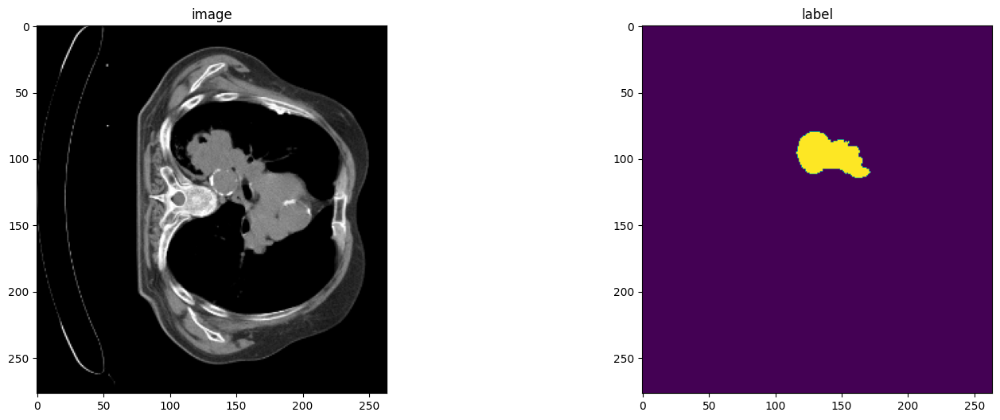

In [21]:
slice_map = {
    "LUNG1-019.nii.gz": 80,
    "LUNG1-002.nii.gz": 150,
    "img0037.nii.gz": 204,
    "img0038.nii.gz": 204,
    "img0039.nii.gz": 204,
    "img0040.nii.gz": 180,
}
case_num = 0
img_name = os.path.split(val_ds[case_num]["image"].meta["filename_or_obj"])[1]
print(img_name)
img = val_ds[case_num]["image"]
label = val_ds[case_num]["label"]
img_shape = img.shape
label_shape = label.shape
print(f"image shape: {img_shape}, label shape: {label_shape}")
plt.figure("image", (18, 6))
plt.subplot(1, 2, 1)
plt.title("image")
plt.imshow(img[0, :, :, slice_map[img_name]].detach().cpu(), cmap="gray")
plt.subplot(1, 2, 2)
plt.title("label")
plt.imshow(label[0, :, :, slice_map[img_name]].detach().cpu())
plt.show()

## Create Swin UNETR model

In this section, we create a Swin UNETR model for the 14-class multi-organ segmentation. We use a feature size of 48, which is compatible with the self-supervised pre-trained weights. We also use gradient checkpointing (use_checkpoint) for more memory-efficient training. 

In [22]:
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = SwinUNETR(
    img_size=(96, 96, 96),
    in_channels=1,
    out_channels=5,
    feature_size=48,
    use_checkpoint=True,
).to(device)

/opt/conda/lib/python3.10/site-packages/monai/utils/deprecate_utils.py:221: FutureWarning: monai.networks.nets.swin_unetr SwinUNETR.__init__:img_size: Argument `img_size` has been deprecated since version 1.3. It will be removed in version 1.5. The img_size argument is not required anymore and checks on the input size are run during forward().
  warn_deprecated(argname, msg, warning_category)


### Initialize Swin UNETR encoder from self-supervised pre-trained weights

In this section, we intialize the Swin UNETR encoder from pre-trained weights. The weights can be downloaded using the wget command below, or by following [this link](https://github.com/Project-MONAI/MONAI-extra-test-data/releases/download/0.8.1/model_swinvit.pt) to GitHub. If training from scratch is desired, please skip this section.

In [23]:
!wget https://huggingface.co/alicelouis/Swin_UNET_49case_7000inter/resolve/main/classNSCLC_5000.pth

--2024-08-07 17:41:54--  https://huggingface.co/alicelouis/Swin_UNET_49case_7000inter/resolve/main/classNSCLC_5000.pth
Resolving huggingface.co (huggingface.co)... 3.163.189.37, 3.163.189.74, 3.163.189.90, ...
Connecting to huggingface.co (huggingface.co)|3.163.189.37|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://cdn-lfs-us-1.huggingface.co/repos/2a/9a/2a9ac2354c753faa12764782abb2772a6145048451c65206359d7d67514328b7/0aa148a06cac94f090242453a4ca78aadd455a4135ce7a2b2d3d6958e03c72a1?response-content-disposition=inline%3B+filename*%3DUTF-8%27%27classNSCLC_5000.pth%3B+filename%3D%22classNSCLC_5000.pth%22%3B&Expires=1723311714&Policy=eyJTdGF0ZW1lbnQiOlt7IkNvbmRpdGlvbiI6eyJEYXRlTGVzc1RoYW4iOnsiQVdTOkVwb2NoVGltZSI6MTcyMzMxMTcxNH19LCJSZXNvdXJjZSI6Imh0dHBzOi8vY2RuLWxmcy11cy0xLmh1Z2dpbmdmYWNlLmNvL3JlcG9zLzJhLzlhLzJhOWFjMjM1NGM3NTNmYWExMjc2NDc4MmFiYjI3NzJhNjE0NTA0ODQ1MWM2NTIwNjM1OWQ3ZDY3NTE0MzI4YjcvMGFhMTQ4YTA2Y2FjOTRmMDkwMjQyNDUzYTRjYTc4YWFkZDQ1NWE0MTM1Y2U

In [ ]:
# uncomment to download the pre-trained weights
!wget https://github.com/Project-MONAI/MONAI-extra-test-data/releases/download/0.8.1/model_swinvit.pt

In [56]:
from torch import nn
# Wrap model with DataParallel
model = nn.DataParallel(model)
model = model.to(device)

In [ ]:
weight = torch.load("/kaggle/working/model_swinvit.pt")
model.module.load_from(weights=weight)
print("Using pretrained self-supervied Swin UNETR backbone weights !")

In [25]:
state_dict = torch.load("/kaggle/working/classNSCLC_5000.pth")
new_state_dict = {}
for key in state_dict:
  new_key = key.replace('module.','')
  new_state_dict[new_key] = state_dict[key]

model = model
model.load_state_dict(new_state_dict)

<All keys matched successfully>

### Optimizer and loss function

In [26]:
torch.backends.cudnn.benchmark = True
loss_function = DiceCELoss(to_onehot_y=True, softmax=True)
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-5)
scaler = torch.cuda.amp.GradScaler()

### Execute a typical PyTorch training process

multi-GPUs

In [27]:
def validation(epoch_iterator_val):
    model.eval()
    with torch.no_grad():
        for batch in epoch_iterator_val:
            val_inputs, val_labels = (batch["image"].cuda(), batch["label"].cuda())
            with torch.cuda.amp.autocast():
                val_outputs = sliding_window_inference(val_inputs, (96, 96, 96), 4, model)
            val_labels_list = decollate_batch(val_labels)
            val_labels_convert = [post_label(val_label_tensor) for val_label_tensor in val_labels_list]
            val_outputs_list = decollate_batch(val_outputs)
            val_output_convert = [post_pred(val_pred_tensor) for val_pred_tensor in val_outputs_list]
            dice_metric(y_pred=val_output_convert, y=val_labels_convert)
            epoch_iterator_val.set_description("Validate (%d / %d Steps)" % (global_step, 10.0))  # noqa: B038
        mean_dice_val = dice_metric.aggregate().item()
        dice_metric.reset()
    return mean_dice_val


def train(global_step, train_loader, dice_val_best, global_step_best):
    model.train()
    epoch_loss = 0
    step = 0
    epoch_iterator = tqdm(train_loader, desc="Training (X / X Steps) (loss=X.X)", dynamic_ncols=True)
    for step, batch in enumerate(epoch_iterator):
        step += 1
        x, y = (batch["image"].cuda(), batch["label"].cuda())
        with torch.cuda.amp.autocast():
            logit_map = model(x)
            loss = loss_function(logit_map, y)
        scaler.scale(loss).backward()
        epoch_loss += loss.item()
        scaler.unscale_(optimizer)
        scaler.step(optimizer)
        scaler.update()
        optimizer.zero_grad()
        epoch_iterator.set_description(  # noqa: B038
            f"Training ({global_step} / {max_iterations} Steps) (loss={loss:2.5f})"
        )
        if (global_step % eval_num == 0 and global_step != 0) or global_step == max_iterations:
            epoch_iterator_val = tqdm(val_loader, desc="Validate (X / X Steps) (dice=X.X)", dynamic_ncols=True)
            dice_val = validation(epoch_iterator_val)
            epoch_loss /= step
            epoch_loss_values.append(epoch_loss)
            metric_values.append(dice_val)
            if dice_val > dice_val_best:
                dice_val_best = dice_val
                global_step_best = global_step
                torch.save(model.state_dict(), os.path.join(root_dir, "best_metric_model.pth"))
                print(
                    "Model Was Saved ! Current Best Avg. Dice: {} Current Avg. Dice: {}".format(dice_val_best, dice_val)
                )
            else:
                print(
                    "Model Was Not Saved ! Current Best Avg. Dice: {} Current Avg. Dice: {}".format(
                        dice_val_best, dice_val
                    )
                )
        global_step += 1
    return global_step, dice_val_best, global_step_best

In [28]:
root_dir = '/kaggle/working/'

In [ ]:
import gc
torch.cuda.empty_cache()
gc.collect()

In [30]:
set_track_meta(True)

## train

In [31]:
max_iterations = 10000
eval_num = 500
post_label = AsDiscrete(to_onehot=5)
post_pred = AsDiscrete(argmax=True, to_onehot=5)
dice_metric = DiceMetric(include_background=True, reduction="mean", get_not_nans=False)
global_step = 0
dice_val_best = 0.0
global_step_best = 0
epoch_loss_values = []
metric_values = []

while global_step < max_iterations:
    global_step, dice_val_best, global_step_best = train(global_step, train_loader, dice_val_best, global_step_best)
model.load_state_dict(torch.load(os.path.join(root_dir, "best_metric_model.pth")))

Training (37 / 10000 Steps) (loss=0.80123):  37%|███▋      | 38/102 [02:04<03:25,  3.21s/it]Exception in thread Thread-29 (enqueue_values):
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/transform.py", line 141, in apply_transform
    return _apply_transform(transform, data, unpack_items, lazy, overrides, log_stats)
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/transform.py", line 98, in _apply_transform
    return transform(data, lazy=lazy) if isinstance(transform, LazyTrait) else transform(data)
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/croppad/dictionary.py", line 997, in __call__
    self.randomize(d.get(self.label_key), fg_indices, bg_indices, d.get(self.image_key))
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/croppad/dictionary.py", line 979, in randomize
    self.cropper.randomize(label=label, fg_indices=fg_indices, bg_indices=bg_indices, image=image)
  File "/opt/c

Model Was Saved ! Current Best Avg. Dice: 0.5875764489173889 Current Avg. Dice: 0.5875764489173889


Training (583 / 10000 Steps) (loss=0.77364):  92%|█████████▏| 94/102 [06:13<00:30,  3.87s/it]Exception in thread Thread-39 (enqueue_values):
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/transform.py", line 141, in apply_transform
    return _apply_transform(transform, data, unpack_items, lazy, overrides, log_stats)
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/transform.py", line 98, in _apply_transform
    return transform(data, lazy=lazy) if isinstance(transform, LazyTrait) else transform(data)
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/croppad/dictionary.py", line 997, in __call__
    self.randomize(d.get(self.label_key), fg_indices, bg_indices, d.get(self.image_key))
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/croppad/dictionary.py", line 979, in randomize
    self.cropper.randomize(label=label, fg_indices=fg_indices, bg_indices=bg_indices, image=image)
  File "/opt/

Model Was Not Saved ! Current Best Avg. Dice: 0.5875764489173889 Current Avg. Dice: 0.5434674024581909


Training (1091 / 10000 Steps) (loss=0.80216):  97%|█████████▋| 99/102 [06:19<00:11,  3.68s/it]Exception in thread Thread-52 (enqueue_values):
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/transform.py", line 141, in apply_transform
    return _apply_transform(transform, data, unpack_items, lazy, overrides, log_stats)
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/transform.py", line 98, in _apply_transform
    return transform(data, lazy=lazy) if isinstance(transform, LazyTrait) else transform(data)
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/croppad/dictionary.py", line 997, in __call__
    self.randomize(d.get(self.label_key), fg_indices, bg_indices, d.get(self.image_key))
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/croppad/dictionary.py", line 979, in randomize
    self.cropper.randomize(label=label, fg_indices=fg_indices, bg_indices=bg_indices, image=image)
  File "/opt

Model Was Saved ! Current Best Avg. Dice: 0.5895856618881226 Current Avg. Dice: 0.5895856618881226


Training (1524 / 10000 Steps) (loss=0.68222):  66%|██████▌   | 67/102 [04:00<01:51,  3.17s/it]Exception in thread Thread-59 (enqueue_values):
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/transform.py", line 141, in apply_transform
    return _apply_transform(transform, data, unpack_items, lazy, overrides, log_stats)
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/transform.py", line 98, in _apply_transform
    return transform(data, lazy=lazy) if isinstance(transform, LazyTrait) else transform(data)
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/croppad/dictionary.py", line 997, in __call__
    self.randomize(d.get(self.label_key), fg_indices, bg_indices, d.get(self.image_key))
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/croppad/dictionary.py", line 979, in randomize
    self.cropper.randomize(label=label, fg_indices=fg_indices, bg_indices=bg_indices, image=image)
  File "/opt

Model Was Not Saved ! Current Best Avg. Dice: 0.5895856618881226 Current Avg. Dice: 0.5131767392158508


Training (2005 / 10000 Steps) (loss=0.66280):  60%|█████▉    | 61/102 [04:01<03:03,  4.49s/it]Exception in thread Thread-73 (enqueue_values):
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/transform.py", line 141, in apply_transform
    return _apply_transform(transform, data, unpack_items, lazy, overrides, log_stats)
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/transform.py", line 98, in _apply_transform
    return transform(data, lazy=lazy) if isinstance(transform, LazyTrait) else transform(data)
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/croppad/dictionary.py", line 997, in __call__
    self.randomize(d.get(self.label_key), fg_indices, bg_indices, d.get(self.image_key))
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/croppad/dictionary.py", line 979, in randomize
    self.cropper.randomize(label=label, fg_indices=fg_indices, bg_indices=bg_indices, image=image)
  File "/opt

Model Was Saved ! Current Best Avg. Dice: 0.604803740978241 Current Avg. Dice: 0.604803740978241


Training (2507 / 10000 Steps) (loss=0.80680):  12%|█▏        | 12/102 [00:58<06:19,  4.21s/it]Exception in thread Thread-84 (enqueue_values):
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/transform.py", line 141, in apply_transform
    return _apply_transform(transform, data, unpack_items, lazy, overrides, log_stats)
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/transform.py", line 98, in _apply_transform
    return transform(data, lazy=lazy) if isinstance(transform, LazyTrait) else transform(data)
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/croppad/dictionary.py", line 997, in __call__
    self.randomize(d.get(self.label_key), fg_indices, bg_indices, d.get(self.image_key))
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/croppad/dictionary.py", line 979, in randomize
    self.cropper.randomize(label=label, fg_indices=fg_indices, bg_indices=bg_indices, image=image)
  File "/opt

Model Was Not Saved ! Current Best Avg. Dice: 0.604803740978241 Current Avg. Dice: 0.5110747218132019


Training (3046 / 10000 Steps) (loss=0.84843):  55%|█████▍    | 56/102 [03:11<01:46,  2.31s/it]Exception in thread Thread-96 (enqueue_values):
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/transform.py", line 141, in apply_transform
    return _apply_transform(transform, data, unpack_items, lazy, overrides, log_stats)
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/transform.py", line 98, in _apply_transform
    return transform(data, lazy=lazy) if isinstance(transform, LazyTrait) else transform(data)
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/croppad/dictionary.py", line 997, in __call__
    self.randomize(d.get(self.label_key), fg_indices, bg_indices, d.get(self.image_key))
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/croppad/dictionary.py", line 979, in randomize
    self.cropper.randomize(label=label, fg_indices=fg_indices, bg_indices=bg_indices, image=image)
  File "/opt

Model Was Not Saved ! Current Best Avg. Dice: 0.604803740978241 Current Avg. Dice: 0.5478776097297668


Training (3508 / 10000 Steps) (loss=0.80354):  95%|█████████▌| 97/102 [05:59<00:18,  3.76s/it]Exception in thread Thread-104 (enqueue_values):
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/transform.py", line 141, in apply_transform
    return _apply_transform(transform, data, unpack_items, lazy, overrides, log_stats)
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/transform.py", line 98, in _apply_transform
    return transform(data, lazy=lazy) if isinstance(transform, LazyTrait) else transform(data)
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/croppad/dictionary.py", line 997, in __call__
    self.randomize(d.get(self.label_key), fg_indices, bg_indices, d.get(self.image_key))
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/croppad/dictionary.py", line 979, in randomize
    self.cropper.randomize(label=label, fg_indices=fg_indices, bg_indices=bg_indices, image=image)
  File "/op

Model Was Saved ! Current Best Avg. Dice: 0.6180011630058289 Current Avg. Dice: 0.6180011630058289


Training (4082 / 10000 Steps) (loss=0.70223):  81%|████████▏ | 83/102 [05:22<01:23,  4.41s/it]Exception in thread Thread-120 (enqueue_values):
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/transform.py", line 141, in apply_transform
    return _apply_transform(transform, data, unpack_items, lazy, overrides, log_stats)
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/transform.py", line 98, in _apply_transform
    return transform(data, lazy=lazy) if isinstance(transform, LazyTrait) else transform(data)
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/croppad/dictionary.py", line 997, in __call__
    self.randomize(d.get(self.label_key), fg_indices, bg_indices, d.get(self.image_key))
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/croppad/dictionary.py", line 979, in randomize
    self.cropper.randomize(label=label, fg_indices=fg_indices, bg_indices=bg_indices, image=image)
  File "/op

Model Was Not Saved ! Current Best Avg. Dice: 0.6180011630058289 Current Avg. Dice: 0.6114278435707092


Training (4517 / 10000 Steps) (loss=0.82814):  85%|████████▌ | 87/102 [05:09<00:49,  3.28s/it]Exception in thread Thread-131 (enqueue_values):
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/transform.py", line 141, in apply_transform
    return _apply_transform(transform, data, unpack_items, lazy, overrides, log_stats)
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/transform.py", line 98, in _apply_transform
    return transform(data, lazy=lazy) if isinstance(transform, LazyTrait) else transform(data)
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/croppad/dictionary.py", line 997, in __call__
    self.randomize(d.get(self.label_key), fg_indices, bg_indices, d.get(self.image_key))
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/croppad/dictionary.py", line 979, in randomize
    self.cropper.randomize(label=label, fg_indices=fg_indices, bg_indices=bg_indices, image=image)
  File "/op

Model Was Saved ! Current Best Avg. Dice: 0.6226263642311096 Current Avg. Dice: 0.6226263642311096


Training (5035 / 10000 Steps) (loss=0.68783):  95%|█████████▌| 97/102 [06:04<00:20,  4.04s/it]Exception in thread Thread-142 (enqueue_values):
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/transform.py", line 141, in apply_transform
    return _apply_transform(transform, data, unpack_items, lazy, overrides, log_stats)
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/transform.py", line 98, in _apply_transform
    return transform(data, lazy=lazy) if isinstance(transform, LazyTrait) else transform(data)
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/croppad/dictionary.py", line 997, in __call__
    self.randomize(d.get(self.label_key), fg_indices, bg_indices, d.get(self.image_key))
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/croppad/dictionary.py", line 979, in randomize
    self.cropper.randomize(label=label, fg_indices=fg_indices, bg_indices=bg_indices, image=image)
  File "/op

Model Was Not Saved ! Current Best Avg. Dice: 0.6226263642311096 Current Avg. Dice: 0.5827385187149048


Training (5504 / 10000 Steps) (loss=0.79521):  93%|█████████▎| 95/102 [06:09<00:34,  4.91s/it]Exception in thread Thread-151 (enqueue_values):
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/transform.py", line 141, in apply_transform
    return _apply_transform(transform, data, unpack_items, lazy, overrides, log_stats)
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/transform.py", line 98, in _apply_transform
    return transform(data, lazy=lazy) if isinstance(transform, LazyTrait) else transform(data)
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/croppad/dictionary.py", line 997, in __call__
    self.randomize(d.get(self.label_key), fg_indices, bg_indices, d.get(self.image_key))
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/croppad/dictionary.py", line 979, in randomize
    self.cropper.randomize(label=label, fg_indices=fg_indices, bg_indices=bg_indices, image=image)
  File "/op

Model Was Not Saved ! Current Best Avg. Dice: 0.6226263642311096 Current Avg. Dice: 0.5611099600791931


Training (6075 / 10000 Steps) (loss=0.80240):  84%|████████▍ | 86/102 [05:10<00:44,  2.75s/it]Exception in thread Thread-164 (enqueue_values):
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/transform.py", line 141, in apply_transform
    return _apply_transform(transform, data, unpack_items, lazy, overrides, log_stats)
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/transform.py", line 98, in _apply_transform
    return transform(data, lazy=lazy) if isinstance(transform, LazyTrait) else transform(data)
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/croppad/dictionary.py", line 997, in __call__
    self.randomize(d.get(self.label_key), fg_indices, bg_indices, d.get(self.image_key))
  File "/opt/conda/lib/python3.10/site-packages/monai/transforms/croppad/dictionary.py", line 979, in randomize
    self.cropper.randomize(label=label, fg_indices=fg_indices, bg_indices=bg_indices, image=image)
  File "/op

KeyboardInterrupt: 

In [ ]:
cd /tmp/tmpvi7gqu_r

In [ ]:
from IPython.display import FileLink

FileLink(r'./best_metric_model.pth')

In [ ]:
!ls

In [ ]:
!cp -r /tmp/tmpvi7gqu_r/best_metric_model.pth /kaggle/working/

In [ ]:
root_dir

In [ ]:
set_track_meta(True)

In [ ]:
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'


In [32]:
print(f"train completed, best_metric: {dice_val_best:.4f} " f"at iteration: {global_step_best}")

train completed, best_metric: 0.6226 at iteration: 5000


### Plot the loss and metric

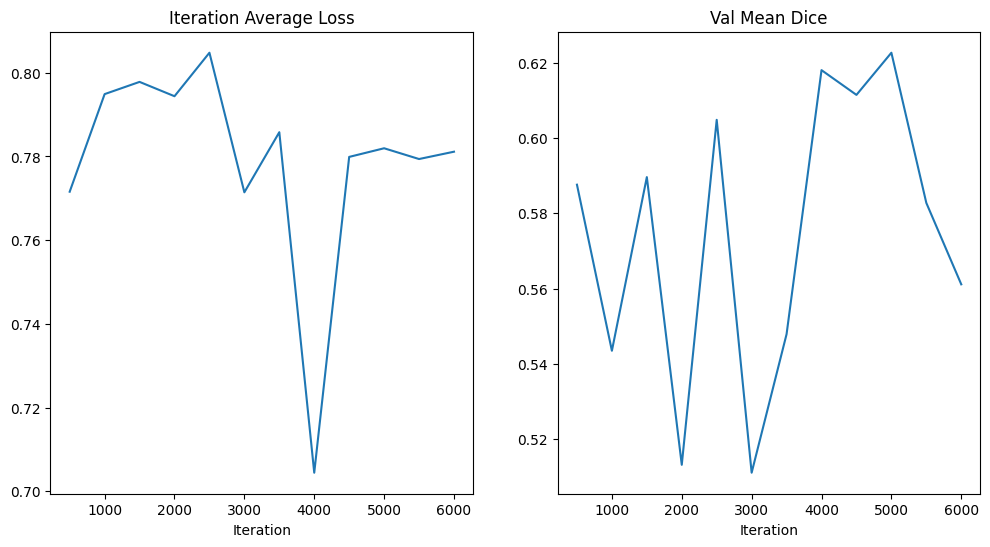

In [33]:
plt.figure("train", (12, 6))
plt.subplot(1, 2, 1)
plt.title("Iteration Average Loss")
x = [eval_num * (i + 1) for i in range(len(epoch_loss_values))]
y = epoch_loss_values
plt.xlabel("Iteration")
plt.plot(x, y)
plt.subplot(1, 2, 2)
plt.title("Val Mean Dice")
x = [eval_num * (i + 1) for i in range(len(metric_values))]
y = metric_values
plt.xlabel("Iteration")
plt.plot(x, y)
plt.show()

### Check best model output with the input image and label

In [46]:
set_track_meta(False)

In [61]:
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = SwinUNETR(
    img_size=(96, 96, 96),
    in_channels=1,
    out_channels=5,
    feature_size=48,
    use_checkpoint=True,
).to(device)

/opt/conda/lib/python3.10/site-packages/monai/utils/deprecate_utils.py:221: FutureWarning: monai.networks.nets.swin_unetr SwinUNETR.__init__:img_size: Argument `img_size` has been deprecated since version 1.3. It will be removed in version 1.5. The img_size argument is not required anymore and checks on the input size are run during forward().
  warn_deprecated(argname, msg, warning_category)


In [62]:
state_dict = torch.load("/kaggle/working/best_metric_model.pth")
new_state_dict = {}
for key in state_dict:
  new_key = key.replace('module.','')
  new_state_dict[new_key] = state_dict[key]

model = model
model.load_state_dict(new_state_dict)

<All keys matched successfully>

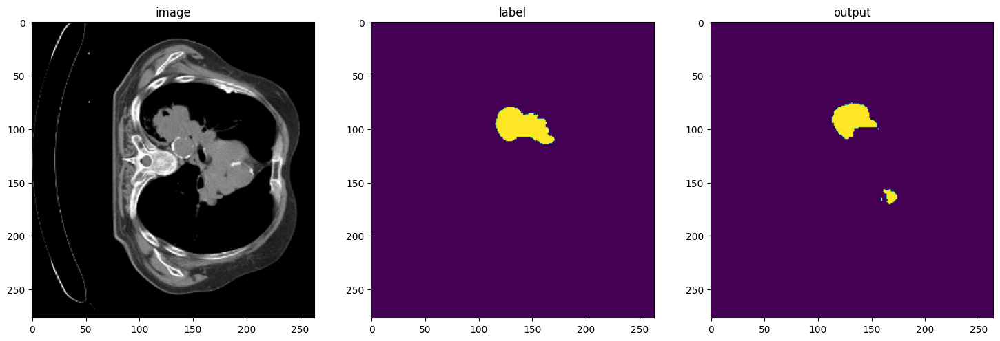

In [34]:
slice_map = {
    "LUNG1-019.nii.gz": 80,
    "LUNG1_002.nii.gz": 150,
    "img0037.nii.gz": 204,
    "img0038.nii.gz": 204,
    "img0039.nii.gz": 204,
    "img0040.nii.gz": 180,
}
case_num = 0
# model.load_state_dict(torch.load(os.path.join(root_dir, "best_metric_model.pth")))
model.eval()
with torch.no_grad():
    img_name = os.path.split(val_ds[case_num]["image"].meta["filename_or_obj"])[1]
    img = val_ds[case_num]["image"]
    label = val_ds[case_num]["label"]
    val_inputs = torch.unsqueeze(img, 1).cuda()
    val_labels = torch.unsqueeze(label, 1).cuda()
    val_outputs = sliding_window_inference(val_inputs, (96, 96, 96), 4, model, overlap=0.8)
    plt.figure("check", (18, 6))
    plt.subplot(1, 3, 1)
    plt.title("image")
    plt.imshow(val_inputs.cpu().numpy()[0, 0, :, :, slice_map[img_name]], cmap="gray")
    plt.subplot(1, 3, 2)
    plt.title("label")
    plt.imshow(val_labels.cpu().numpy()[0, 0, :, :, slice_map[img_name]])
    plt.subplot(1, 3, 3)
    plt.title("output")
    plt.imshow(torch.argmax(val_outputs, dim=1).detach().cpu()[0, :, :, slice_map[img_name]])
    plt.show()

In [ ]:
torch.max(val_labels[0, 0, :, :, :])

In [ ]:
val_outputs.shape

In [ ]:
torch.max(torch.argmax(val_outputs, dim=1).detach().cpu()[0, :, :,:])

In [38]:
import numpy as np
import plotly.graph_objects as go

# Assuming your 3D mask tensor is a NumPy array called 'mask'
# Replace this with your actual tensor
mask = val_labels[0, 0, :, :, :]

# Get the coordinates of the non-zero elements in the mask
x, y, z = np.nonzero(mask)

# Create a 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',
    marker=dict(
        size=2,
        color='blue',
        opacity=0.8
    )
)])

fig.update_layout(
    scene=dict(
        xaxis=dict(nticks=10, range=[0, mask.shape[0]]),
        yaxis=dict(nticks=10, range=[0, mask.shape[1]]),
        zaxis=dict(nticks=10, range=[0, mask.shape[2]])
    ),
    width=700,
    margin=dict(r=20, l=10, b=10, t=10)
)

fig.show()


In [35]:
import numpy as np
import plotly.graph_objects as go

# Assuming your 3D mask tensor is a NumPy array called 'mask'
# Replace this with your actual tensor
mask = torch.argmax(val_outputs, dim=1).detach().cpu()[0, :, :, :]

# Get the coordinates of the non-zero elements in the mask
x, y, z = np.nonzero(mask)

# Create a 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',
    marker=dict(
        size=2,
        color='blue',
        opacity=0.8
    )
)])

fig.update_layout(
    scene=dict(
        xaxis=dict(nticks=10, range=[0, mask.shape[0]]),
        yaxis=dict(nticks=10, range=[0, mask.shape[1]]),
        zaxis=dict(nticks=10, range=[0, mask.shape[2]])
    ),
    width=700,
    margin=dict(r=20, l=10, b=10, t=10)
)

fig.show()


### Cleanup data directory

Remove directory if a temporary was used.

In [ ]:
if directory is None:
    shutil.rmtree(root_dir)

In [ ]:
!pip install plotly

In [ ]:
import gc
torch.cuda.empty_cache()
gc.collect()

In [ ]:
import os
import torch
import numpy as np
import plotly.graph_objects as go
from monai.transforms import (
    Compose, LoadImage, ScaleIntensity, EnsureType, SpatialPad, EnsureChannelFirst, Resize
)


# Enable metadata tracking
set_track_meta(True)

# Define transformations with padding to ensure dimensions are divisible by 32
transforms = Compose([
    LoadImage(image_only=True), 
    EnsureChannelFirst(), 
    ScaleIntensity(), 
    Resize(spatial_size=[512, 512, 160]),  # Resize to match the model's input size requirement
    EnsureType()
])

# Load a sample file (adjust the path and filename as necessary)
root_dir = "/kaggle/working/imagesTr"
filename = "LUNG1_001.nii.gz"
img = transforms(os.path.join(root_dir, filename))

# Prepare the image for inference
img = img.unsqueeze(0)  # Remove .cuda() to keep it on CPU

# Load your model
model.load_state_dict(torch.load("/kaggle/working/best_metric_model.pth", map_location=torch.device('cpu')))  # Load model on CPU
model.eval()
model.to('cpu')

# Perform inference
with torch.no_grad():
    output = model(img)
    output = torch.argmax(output, dim=1).detach().numpy()[0]  # Remove .cpu()

# Assuming the output has multiple classes, create a mask for each class
num_classes = output.max() + 1  # Adjust based on your model's number of output classes
fig = go.Figure()

# Create a 3D plot for each class
for class_id in range(1, num_classes):  # Start from 1 to skip background class 0
    binary_mask = (output == class_id).astype(np.uint8)
    fig.add_trace(go.Volume(
        x=np.arange(binary_mask.shape[0]),
        y=np.arange(binary_mask.shape[1]),
        z=np.arange(binary_mask.shape[2]),
        value=binary_mask,
        isomin=0,
        isomax=1,
        opacity=0.1,  # Adjust this for better visualization
        surface_count=20,  # Number of isosurfaces
        colorscale='Viridis',  # Or any other colorscale
        name=f'Class {class_id}'
    ))

fig.update_layout(scene=dict(
    xaxis_title='X',
    yaxis_title='Y',
    zaxis_title='Z',
    aspectmode='data'
))

fig.show()


## run model and visualization

(512, 512, 111)


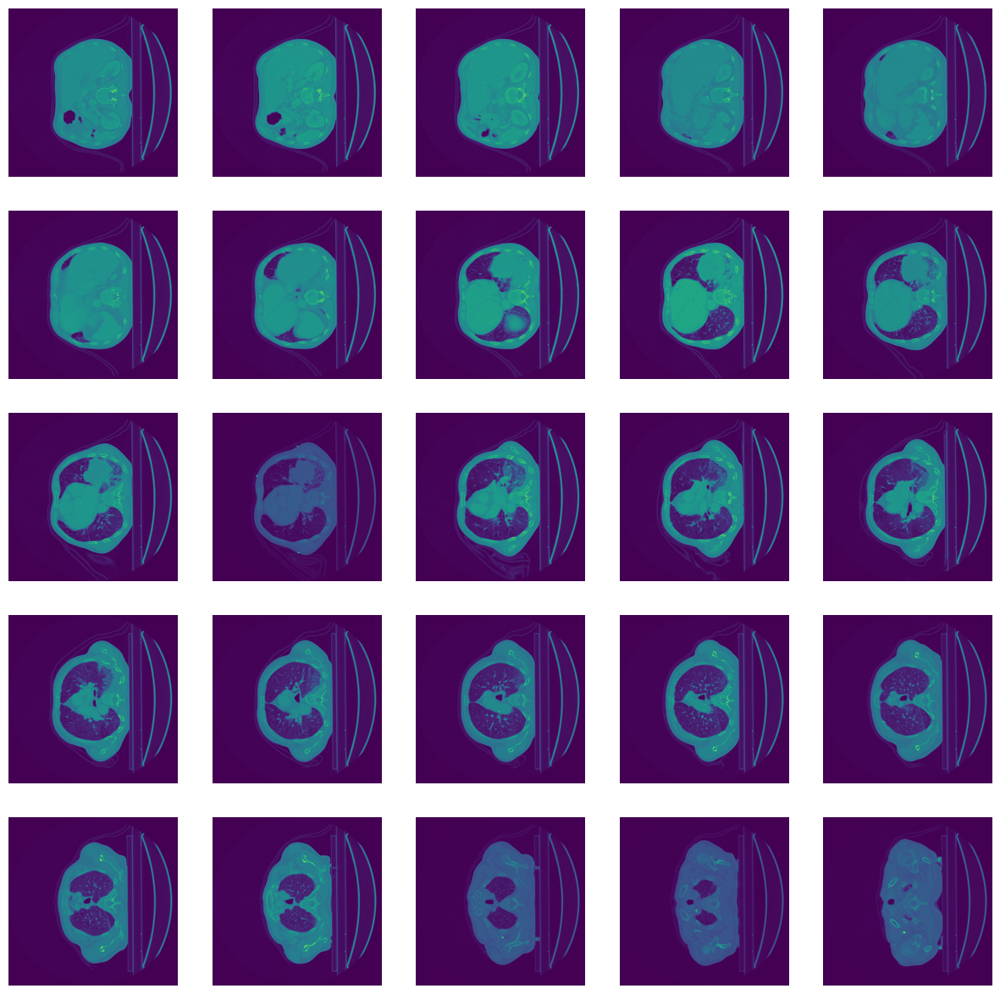

In [12]:
import os
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt

def multi_visualization(nii_file_path, plotting=True):
    # Load the .nii.gz file
    nii_img = nib.load(nii_file_path)

    # Get the image data as a 3D numpy array
    volCT = nii_img.get_fdata()
    print(volCT.shape)

    if plotting:
        # Display 25 slices of the 3D volume
        fig, ax = plt.subplots(5, 5, figsize=[15,15])
        slice_step = volCT.shape[2] // 25  # Determine the step to take 25 slices evenly distributed

        for i in range(5):
            for j in range(5):
                slice_num = (i * 5 + j) * slice_step
                ax[i, j].imshow(volCT[:, :, slice_num], cmap='viridis')
                ax[i, j].axis('off')

        plt.show()

    return volCT

# # Usage example
# scans_path = "/kaggle/working/imagesTr"
# list_of_scans = os.listdir(scans_path)
# scan_num = 1
nii_file_path = './LUNG1-002.nii.gz'

volCT = multi_visualization(nii_file_path)


In [13]:
import numpy as np

def preprocess_CT(volCT):
    # Shift the volume so that the minimum value is 0
    volume_shifted = volCT - np.min(volCT)

    # Convert the volume to float32
    volume_float32 = volume_shifted.astype(np.float32)

    # Normalize the volume to the range [0, 1]
    volume_float32 /= np.max(volume_float32)

    # Output the min, max, and dtype of the voxels before and after conversion
    print("Before conversion - Min:", np.min(volCT), "Max:", np.max(volCT), "Dtype:", volCT.dtype)
    print("After conversion - Min:", np.min(volume_float32), "Max:", np.max(volume_float32), "Dtype:", volume_float32.dtype)

    # Check that the conversion worked
    assert volume_float32.dtype == np.float32

    # Check that the normalization worked
    assert np.min(volume_float32) == 0.0
    assert np.max(volume_float32) == 1.0

    return volume_float32

# # Usage example (assuming volCT is already loaded from a .nii.gz file using nibabel)
# scans_path = "/kaggle/working/imagesTr"
# list_of_scans = os.listdir(scans_path)
# scan_num = 2
# nii_file_path = os.path.join(scans_path, list_of_scans[scan_num])

# nii_img = nib.load(nii_file_path)
# volCT = nii_img.get_fdata()

processed_volCT = preprocess_CT(volCT)


Before conversion - Min: -1024.0 Max: 3071.0 Dtype: float64
After conversion - Min: 0.0 Max: 1.0 Dtype: float32


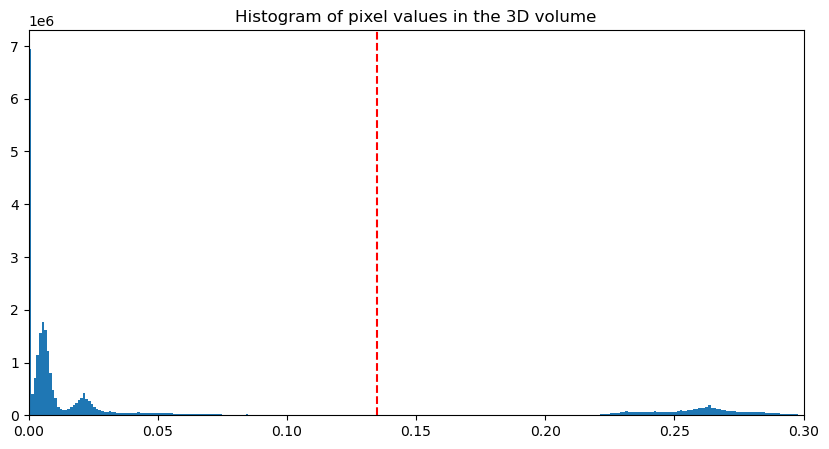

In [14]:
plt.figure(figsize=[10,5])
plt.hist(processed_volCT.flatten(), bins=1000)
plt.axvline(x=threshold_otsu(processed_volCT), color='r', linestyle='--')
plt.title('Histogram of pixel values in the 3D volume')
plt.xlim([0, 0.3])
plt.show()

In [15]:
def binary_mask(volume_float32, thresh,plotting=True):
    # Apply the threshold
    binary_volume = volume_float32 > thresh

    # Visualize the result
    if plotting==True:
        plt.figure(figsize=[10,10])
        plt.imshow(binary_volume[:,:,20])
        plt.show()
        
    return binary_volum

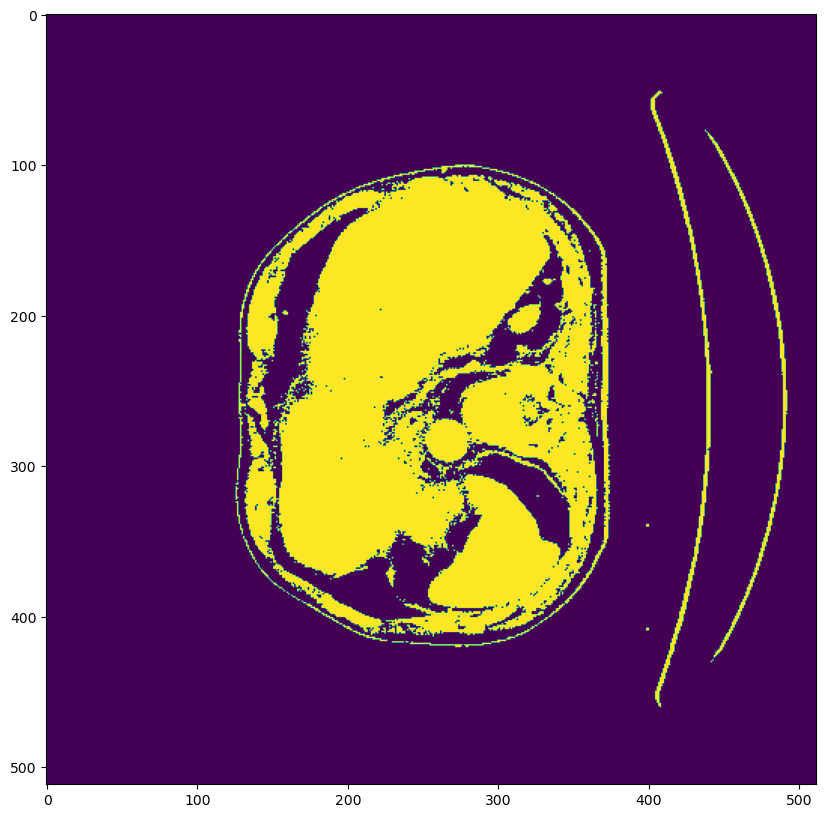

NameError: name 'binary_volum' is not defined

In [16]:
binary_volum = binary_mask(volCT, threshold_otsu(processed_volCT))

## เริ่มจริง

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu
from skimage.measure import label

def lung_separation(volume_float32, plotting=True):
    vol = volume_float32
    
    # Calculate the Otsu threshold for the entire volume
    thresh = threshold_otsu(vol)
    
    # Create a binary volume mask of anything below the threshold
    volBW = vol < thresh

    # Find connected components in the binary mask
    labeled_vol, num_features = label(volBW, connectivity=1, return_num=True)

    # Iterate through each slice
    for s in range(labeled_vol.shape[2]):  # Iterate over the third dimension (slices)
        # Find all connected components in the slice
        connected_components, component_count = label(labeled_vol[:, :, s], connectivity=1, return_num=True)
        
        # For each connected component in the slice
        for c in range(1, component_count + 1):  # Start from 1 as 0 is background
            # Check if the connected component touches the edge of the image
            if (np.any(connected_components == c) and 
                (np.any(connected_components[0, :] == c) or 
                 np.any(connected_components[-1, :] == c) or 
                 np.any(connected_components[:, 0] == c) or 
                 np.any(connected_components[:, -1] == c))):
                # Set all pixels of the connected component in volBW to 0
                volBW[:, :, s][connected_components == c] = 0
                
    # Visualize the result
    if plotting:
        _, ax = plt.subplots(5, 5, figsize=[15, 15])
        slice_step = volBW.shape[2] // 25  # Determine step size to take 25 slices evenly distributed
        for i in range(5):
            for j in range(5):
                slice_num = (i * 5 + j) * slice_step
                ax[i, j].imshow(volBW[:, :, slice_num], cmap='viridis')
                ax[i, j].axis('off')
        plt.show()
    
    return volBW

# # Usage example (assuming volCT is already loaded and preprocessed)
# scans_path = "/kaggle/working/imagesTr"
# list_of_scans = os.listdir(scans_path)
# scan_num = 2
nii_file_path = './LUNG1-002.nii.gz'

nii_img = nib.load(nii_file_path)
volCT = nii_img.get_fdata()

# Preprocess the volume
processed_volCT = preprocess_CT(volCT)

# Separate the lungs
lung_mask = lung_separation(processed_volCT, plotting=False)

Before conversion - Min: -1024.0 Max: 3071.0 Dtype: float64
After conversion - Min: 0.0 Max: 1.0 Dtype: float32


In [19]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import label

def volume_filterin(volBW, V=100, plotting=True):
    smoothed_vol = np.copy(volBW)

    # Iterate through each slice along the third dimension
    for s in range(smoothed_vol.shape[2]):  # Iterate over the third dimension (slices)
        # Find all connected components in the slice
        connected_components, component_count = label(smoothed_vol[:, :, s], connectivity=1, return_num=True)
        
        # For each connected component in the slice
        for c in range(1, component_count + 1):  # Start from 1 as 0 is background
            # Check if the connected component is smaller than V (in terms of number of pixels)
            if np.sum(connected_components == c) < V:
                # Set all pixels of the connected component in smoothed_vol to 0
                smoothed_vol[:, :, s][connected_components == c] = 0

    # Visualize the result
    if plotting:
        _, ax = plt.subplots(5, 5, figsize=[15, 15])
        slice_step = smoothed_vol.shape[2] // 25  # Determine step size to take 25 slices evenly distributed
        for i in range(5):
            for j in range(5):
                slice_num = (i * 5 + j) * slice_step
                ax[i, j].imshow(smoothed_vol[:, :, slice_num], cmap='viridis')
                ax[i, j].axis('off')

        plt.show()

    return smoothed_vol

# Usage example (assuming lung_mask is already obtained)
smoothed_lung_mask = volume_filterin(lung_mask , plotting = False)


In [68]:
smoothed_lung_mask.shape

(512, 512, 111)

In [20]:
from skimage.morphology import binary_closing
import numpy as np
import matplotlib.pyplot as plt

def applying_binary_closing(smoothed_vol, plotting =True):
    # Iterate through each slice along the third dimension
    for s in range(smoothed_vol.shape[2]):  # Iterate over the third dimension (slices)
        # Perform binary closing on the slice
        smoothed_vol[:, :, s] = binary_closing(smoothed_vol[:, :, s])
        
    # Visualize the result
    if plotting:
        _, ax = plt.subplots(5, 5, figsize=[15, 15])
        slice_step = smoothed_vol.shape[2] // 25  # Determine step size to take 25 slices evenly distributed
        for i in range(5):
            for j in range(5):
                slice_num = (i * 5 + j) * slice_step
                ax[i, j].imshow(smoothed_vol[:, :, slice_num], cmap='viridis')
                ax[i, j].axis('off')
        plt.show()
    
    return smoothed_vol

# Usage example (assuming smoothed_lung_mask is already obtained)
closed_lung_mask = applying_binary_closing(smoothed_lung_mask, plotting =False)


In [69]:
closed_lung_mask.shape

(512, 512, 111)

## 3d lung

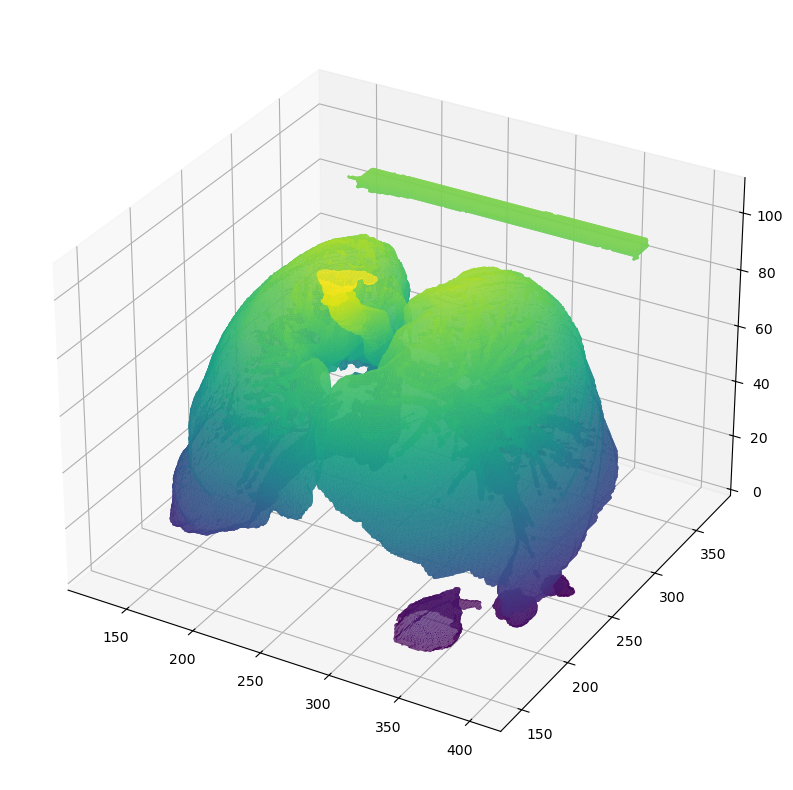

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import marching_cubes

def rendering_of_the_lungs_3D(smoothed_vol):
    # Extract the mesh using marching cubes algorithm
    verts, faces, _, _ = marching_cubes(smoothed_vol, level=0.5)

    # Visualize the mesh
    fig = plt.figure(figsize=[10, 10])
    ax = fig.add_subplot(111, projection='3d')

    # Fancy indexing: verts[faces] gives the vertices of each triangle
    ax.plot_trisurf(verts[:, 0], verts[:, 1], faces, verts[:, 2], cmap='viridis', lw=1)
    
    plt.show()
    
    return verts, faces

# Usage example (assuming closed_lung_mask is already obtained and is a binary mask)
verts, faces = rendering_of_the_lungs_3D(closed_lung_mask)


## model on cpu

In [1]:
import os
import shutil
import tempfile

import matplotlib.pyplot as plt
from tqdm import tqdm

from monai.losses import DiceCELoss
from monai.inferers import sliding_window_inference
from monai.transforms import (
    AsDiscrete,
    Compose,
    CropForegroundd,
    LoadImaged,
    Orientationd,
    EnsureChannelFirstd,
    RandFlipd,
    RandCropByPosNegLabeld,
    RandShiftIntensityd,
    ScaleIntensityRanged,
    Spacingd,
    RandRotate90d,
    EnsureTyped,
    MapTransform
)

from monai.config import print_config
from monai.metrics import DiceMetric
from monai.networks.nets import SwinUNETR

from monai.data import (
    ThreadDataLoader,
    CacheDataset,
    load_decathlon_datalist,
    decollate_batch,
    set_track_meta,
)


import torch

print_config()

MONAI version: 1.4.dev2430
Numpy version: 1.26.4
Pytorch version: 2.2.2+cu118
MONAI flags: HAS_EXT = False, USE_COMPILED = False, USE_META_DICT = False
MONAI rev id: 9dd92b4a07706d4b80edace3d39fe008dc805d5a
MONAI __file__: d:\anaconda\Lib\site-packages\monai\__init__.py

Optional dependencies:
Pytorch Ignite version: 0.4.11
ITK version: 5.4.0
Nibabel version: 5.2.1
scikit-image version: 0.22.0
scipy version: 1.14.0
Pillow version: 10.2.0
Tensorboard version: 2.17.0
gdown version: 5.2.0
TorchVision version: 0.17.2+cu118
tqdm version: 4.65.0
lmdb version: 1.4.1
psutil version: 5.9.0
pandas version: 2.1.4
einops version: 0.7.0
transformers version: 4.39.1
mlflow version: 2.14.3
pynrrd version: 1.0.0
clearml version: 1.16.3rc2

For details about installing the optional dependencies, please visit:
    https://docs.monai.io/en/latest/installation.html#installing-the-recommended-dependencies



In [2]:
class ConvertToStage(MapTransform):
    """
    Convert labels to stage of lung cancer
    """
    def __init__(self, keys, clinical_data):
        self.keys = keys
        self.clinical_data = clinical_data
        self.stage = ["adenocarcinoma", "squamous cell carcinoma", "large cell", "nos"]
        super().__init__(keys)
    stage = ["adenocarcinoma", "squamous cell carcinoma", "large cell", "nos"]
    
    
    def __call__(self, data):
        d = dict(data)
        # Add additional labels from clinical data
        patient_id = d["PatientID"]
        clinical_info = self.clinical_data[self.clinical_data["PatientID"] == patient_id]
        overall_stage = clinical_info["Histology"].values[0]
        
        id = self.stage.index(overall_stage)
        
        for key in self.keys:
            # Create a mask for all non-zero elements
            mask = d[key] != 0
            # Replace all non-zero elements with the stage index + 1
            d[key][mask] = int(id) + 1
        return d


In [4]:
import pandas as pd 
clinical_data = pd.read_csv('./data.csv')
clinical_data.head()

,PatientID,age,clinical.T.Stage,Clinical.N.Stage,Clinical.M.Stage,Overall.Stage,Histology,gender,Survival.time,deadstatus.event
0,LUNG1-001,78.7515,2.0,3,0,IIIb,large cell,male,2165,1
1,LUNG1-002,83.8001,2.0,0,0,I,squamous cell carcinoma,male,155,1
2,LUNG1-003,68.1807,2.0,3,0,IIIb,large cell,male,256,1
3,LUNG1-004,70.8802,2.0,1,0,II,squamous cell carcinoma,male,141,1
4,LUNG1-005,80.4819,4.0,2,0,IIIb,squamous cell carcinoma,male,353,1


In [5]:
num_samples = 2
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

train_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"], ensure_channel_first=True),
        ConvertToStage(keys="label", clinical_data = clinical_data),
        ScaleIntensityRanged(
            keys=["image"],
            a_min=-175,
            a_max=250,
            b_min=0.0,
            b_max=1.0,
            clip=True,
        ),
        CropForegroundd(keys=["image", "label"], source_key="image"),
        Orientationd(keys=["image", "label"], axcodes="RAS"),
        Spacingd(
            keys=["image", "label"],
            pixdim=(1.5, 1.5, 2.0),
            mode=("bilinear", "nearest"),
        ),
        EnsureTyped(keys=["image", "label"], device=device, track_meta=False),
        RandCropByPosNegLabeld(
            keys=["image", "label"],
            label_key="label",
            spatial_size=(96, 96, 96),
            pos=1,
            neg=1,
            num_samples=num_samples,
            image_key="image",
            image_threshold=0,
        ),
        RandFlipd(
            keys=["image", "label"],
            spatial_axis=[0],
            prob=0.10,
        ),
        RandFlipd(
            keys=["image", "label"],
            spatial_axis=[1],
            prob=0.10,
        ),
        RandFlipd(
            keys=["image", "label"],
            spatial_axis=[2],
            prob=0.10,
        ),
        RandRotate90d(
            keys=["image", "label"],
            prob=0.10,
            max_k=3,
        ),
        RandShiftIntensityd(
            keys=["image"],
            offsets=0.10,
            prob=0.50,
        ),
    ]
)
val_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"], ensure_channel_first=True),
        ConvertToStage(keys="label" , clinical_data = clinical_data),
        ScaleIntensityRanged(keys=["image"], a_min=-175, a_max=250, b_min=0.0, b_max=1.0, clip=True),
        CropForegroundd(keys=["image", "label"], source_key="image"),
        Orientationd(keys=["image", "label"], axcodes="RAS"),
        Spacingd(
            keys=["image", "label"],
            pixdim=(1.5, 1.5, 2.0),
            mode=("bilinear", "nearest"),
        ),
        EnsureTyped(keys=["image", "label"], device=device, track_meta=True),
    ]
)

monai.transforms.croppad.dictionary CropForegroundd.__init__:allow_smaller: Current default value of argument `allow_smaller=True` has been deprecated since version 1.2. It will be changed to `allow_smaller=False` in version 1.5.


In [8]:
import os
import nibabel as nib

# Define the directory containing the .nii files
file_path = '/kaggle/input/ct-nsclc-106-case/NSCLC_46Case/NSCLC_46Case/imagesTr/LUNG1-002.nii'
output_path = '/kaggle/working/'

        
# Load the .nii file
nii = nib.load(file_path)

# Create the output path for the .nii.gz file
file_path_out = os.path.join(output_path, 'LUNG1-002.nii') + '.gz'

# Save it as .nii.gz
nib.save(nii, file_path_out)

print(f'Converted {file_path} to {file_path_out}')

Converted /kaggle/input/ct-nsclc-106-case/NSCLC_46Case/NSCLC_46Case/imagesTr/LUNG1-002.nii to /kaggle/working/LUNG1-002.nii.gz


In [7]:
val_files = [
 {'PatientID': 'LUNG1-002',
  'image': './LUNG1-002.nii.gz',
  'label': './LUNG1-002L.nii.gz'}]
# train_ds = CacheDataset(
#     data=datalist,
#     transform=train_transforms,
#     cache_num=24,
#     cache_rate=1.0,
#     num_workers=8,
# )
# train_loader = ThreadDataLoader(train_ds, num_workers=0, batch_size=1, shuffle=True)
val_ds = CacheDataset(data=val_files, transform=val_transforms, cache_num=6, cache_rate=1.0, num_workers=4)
val_loader = ThreadDataLoader(val_ds, num_workers=0, batch_size=1)

# # as explained in the "Setup transforms" section above, we want cached training images to not have metadata, and validations to have metadata
# # the EnsureTyped transforms allow us to make this distinction
# # on the other hand, set_track_meta is a global API; doing so here makes sure subsequent transforms (i.e., random transforms for training)
# # will be carried out as Tensors, not MetaTensors
set_track_meta(False)

Loading dataset: 100%|██████████| 1/1 [00:04<00:00,  4.11s/it]


In [ ]:
img = val_ds[0]["image"]
label = val_ds[0]["label"]
val_inputs = torch.unsqueeze(img, 1).cuda()
val_labels = torch.unsqueeze(label, 1).cuda()
# val_outputs = sliding_window_inference(val_inputs, (96, 96, 96), 4, model, overlap=0.8)
img

In [9]:
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = SwinUNETR(
    img_size=(96, 96, 96),
    in_channels=1,
    out_channels=5,
    feature_size=48,
    use_checkpoint=True,
).to(device)

monai.networks.nets.swin_unetr SwinUNETR.__init__:img_size: Argument `img_size` has been deprecated since version 1.3. It will be removed in version 1.5. The img_size argument is not required anymore and checks on the input size are run during forward().


In [ ]:
!wget https://huggingface.co/alicelouis/Swin_UNET_49case_7000inter/resolve/main/final_model.pth

In [16]:
state_dict = torch.load("/kaggle/working/final_model.pth" , map_location=torch.device('cuda'))
new_state_dict = {}
for key in state_dict:
  new_key = key.replace('module.','')
  new_state_dict[new_key] = state_dict[key]

model = model
model.load_state_dict(new_state_dict)

<All keys matched successfully>

In [14]:
import time
t0 = time.time() # เวลาเริ่มต้น

model.eval()
with torch.no_grad():
    img = val_ds[0]["image"]
    val_inputs = torch.unsqueeze(img, 1).cuda()
    val_outputs = sliding_window_inference(val_inputs, (96, 96, 96), 4, model, overlap=0.8)
    
print(time.time() - t0) # พิมพ์เวลาสุดท้ายลบด้วยเวลาเริ่มต้น

104.70665097236633


## final

In [32]:
mask.shape

torch.Size([277, 243, 166])

In [39]:
lung_faces.shape

(596312, 3)

In [33]:
np.nonzero(tumor_mask)

tensor([[140, 144,  77],
        [141, 144,  76],
        [141, 144,  77],
        ...,
        [213, 154,  54],
        [213, 154,  55],
        [213, 154,  56]])

In [62]:

new_shape = (512, 512, 111)
scaled_mask = scale_mask(tumor_mask, new_shape)

In [72]:
closed_lung_mask.shape

(512, 512, 111)

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu
from skimage.measure import label

def lung_separation(volume_float32, plotting=True):
    vol = volume_float32
    
    # Calculate the Otsu threshold for the entire volume
    thresh = threshold_otsu(vol)
    
    # Create a binary volume mask of anything below the threshold
    volBW = vol < thresh

    # Find connected components in the binary mask
    labeled_vol, num_features = label(volBW, connectivity=1, return_num=True)

    # Iterate through each slice
    for s in range(labeled_vol.shape[2]):  # Iterate over the third dimension (slices)
        # Find all connected components in the slice
        connected_components, component_count = label(labeled_vol[:, :, s], connectivity=1, return_num=True)
        
        # For each connected component in the slice
        for c in range(1, component_count + 1):  # Start from 1 as 0 is background
            # Check if the connected component touches the edge of the image
            if (np.any(connected_components == c) and 
                (np.any(connected_components[0, :] == c) or 
                 np.any(connected_components[-1, :] == c) or 
                 np.any(connected_components[:, 0] == c) or 
                 np.any(connected_components[:, -1] == c))):
                # Set all pixels of the connected component in volBW to 0
                volBW[:, :, s][connected_components == c] = 0
                
    # Visualize the result
    if plotting:
        _, ax = plt.subplots(5, 5, figsize=[15, 15])
        slice_step = volBW.shape[2] // 25  # Determine step size to take 25 slices evenly distributed
        for i in range(5):
            for j in range(5):
                slice_num = (i * 5 + j) * slice_step
                ax[i, j].imshow(volBW[:, :, slice_num], cmap='viridis')
                ax[i, j].axis('off')
        plt.show()
    
    return volBW

# # Usage example (assuming volCT is already loaded and preprocessed)
# scans_path = "/kaggle/working/imagesTr"
# list_of_scans = os.listdir(scans_path)
# scan_num = 2
nii_file_path = './LUNG1-002.nii.gz'

nii_img = nib.load(nii_file_path)
volCT = nii_img.get_fdata()

# Preprocess the volume
processed_volCT = preprocess_CT(volCT)

# Separate the lungs
lung_mask = lung_separation(processed_volCT, plotting=False)

Before conversion - Min: -1024.0 Max: 3071.0 Dtype: float64
After conversion - Min: 0.0 Max: 1.0 Dtype: float32


In [60]:
import numpy as np
import plotly.graph_objects as go
from scipy.ndimage import zoom

def scale_mask(mask, new_shape):
    # Compute the zoom factors for each dimension
    zoom_factors = [new_shape[i] / mask.shape[i] for i in range(3)]
    
    # Resize the mask
    scaled_mask = zoom(mask, zoom_factors, order=1)  # order=1 for bilinear interpolation
    
    return scaled_mask

def adjust_origin(tumor_mask):
    # Compute the difference in origin
    origin_shift = np.array([10,130,50])
    
    # Shift the tumor mask coordinates by the origin difference
    x, y, z = np.nonzero(tumor_mask)
    x += origin_shift[0]
    y += origin_shift[1]
    z += origin_shift[2]
    
    return x, y, z


def render_tumor_on_lung(tumor_mask, lung_verts, lung_faces):
    # Ensure the mask is a NumPy array
    tumor_mask = np.asarray(tumor_mask)
    
    # Assuming closed_lung_mask has the same shape as the lung mesh volume
    # and represents the shape to which the tumor_mask needs to be scaled
    lung_shape = closed_lung_mask.shape
    
    # Scale the tumor mask to match the lung volume shape
    scaled_mask = scale_mask(tumor_mask, lung_shape)

    
    S_tumor_mask = adjust_origin(tumor_mask)

    # Assuming you have lung_origin and tumor_origin as lists or arrays of (x, y, z) coordinates
    x, y, z = S_tumor_mask
    z = z*1.5

    tumor_trace = go.Scatter3d(
        x=x, y=y, z=z,
        mode='markers',
        marker=dict(
            size=2,
            color='red',
            opacity=0.6
        ),
        name='Tumor'
    )

    # Create 3D mesh for the lungs
    lung_trace = go.Mesh3d(
        x=lung_verts[:, 0],
        y=lung_verts[:, 1],
        z=lung_verts[:, 2]*3,
        i=lung_faces[:, 0],
        j=lung_faces[:, 1],
        k=lung_faces[:, 2],
        color='cyan',
        opacity=0.5,
        name='Lungs'
    )
    
    # Create the figure
    fig = go.Figure(data=[lung_trace, tumor_trace])
    
    # Update layout for better visualization
    fig.update_layout(
        scene=dict(
            xaxis_title='X Axis',
            yaxis_title='Y Axis',
            zaxis_title='Z Axis',
            aspectratio=dict(x=1, y=1, z=3),
            aspectmode='data'
        ),
        title='Lung and Tumor Visualization'
    )
    
    # Show the figure
    fig.show()

# Example usage
# Replace these with actual lung mesh and tumor mask
lung_verts = np.array(verts)  # Assume 'verts' from the lung mesh
lung_faces = np.array(faces)  # Assume 'faces' from the lung mesh
tumor_mask = val_labels.cpu().numpy()[0, 0, :, :, :]  # Convert to NumPy array
print(tumor_mask.shape)

# Call the function to render
render_tumor_on_lung(tumor_mask, lung_verts, lung_faces)


(277, 243, 166)


In [ ]:
plt.subplot(1, 3, 1)
plt.title("image")

In [46]:
val_labels.cpu().numpy()[0, 0, :, :, :].shape

(277, 243, 166)

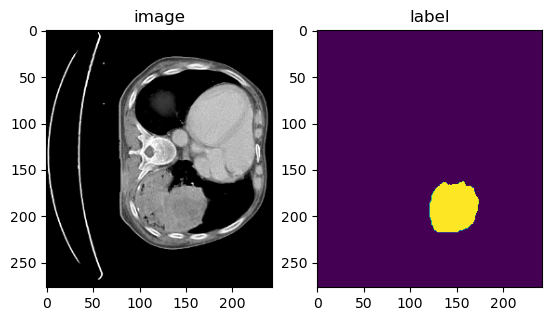

In [57]:
plt.subplot(1, 2, 1)
plt.title("image")
plt.imshow(val_inputs.cpu().numpy()[0, 0, :, :, 43], cmap="gray")
plt.subplot(1, 2, 2)
plt.title("label")
plt.imshow(val_labels.cpu().numpy()[0, 0, :, :, 43])